#Importing Libraries


In [ ]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import math
import cv2
from PIL import Image
import tensorflow as tf
import tensorflow_datasets as tfds
from tensorflow.python.data.experimental import AUTOTUNE
import warnings
warnings.filterwarnings('ignore')

#Data Exploration

In [ ]:
def plot_images(tf_dataset,n_rows,figsize=(30,30)):
    # subplots
    fig,axes = plt.subplots(nrows =n_rows, ncols = 2, figsize=figsize)
    for ax in axes.flatten():
        ax.axis('off')
    count = -1
    for lr, hr in tf_dataset.take(n_rows).as_numpy_iterator():
        count+=1
        print('LR Shape is {} and HR shape is {}'.format(lr[0].shape,hr[0].shape))
        axes[count,0].set_title('Low resolution',fontdict={'fontsize': 20,'fontweight': 'bold'})
        axes[count,0].imshow(lr[0])
        axes[count,1].set_title('High Resolution',fontdict={'fontsize': 20,'fontweight': 'bold'})
        axes[count,1].imshow(hr[0])

In [ ]:
def center_crop(lr_img, hr_img, hr_crop_size=320, scale=5):
    ''' This function crops lr(64x64) and hr(256x256) images at the center'''
    lr_crop_size = hr_crop_size // scale

    lr_shape = tf.shape(lr_img)[:2]
    hr_shape = tf.shape(hr_img)[:2]

    lr_x = (lr_shape[1] - lr_crop_size) // 2
    lr_y = (lr_shape[0] - lr_crop_size) // 2

    hr_x = (hr_shape[1] - hr_crop_size) // 2
    hr_y = (hr_shape[0] - hr_crop_size) // 2

    lr_img_cropped = lr_img[lr_y:lr_y + lr_crop_size, lr_x:lr_x + lr_crop_size]
    hr_img_cropped = hr_img[hr_y:hr_y + hr_crop_size, hr_x:hr_x + hr_crop_size]

    return lr_img_cropped, hr_img_cropped

def random_flip(lr_img, hr_img):
    ''' This function will flip imag left_right randomly'''
    random = tf.random.uniform(shape=(), maxval=1)
    return tf.cond(random < 0.5,lambda: (lr_img, hr_img),
                   lambda: (tf.image.flip_left_right(lr_img),
                            tf.image.flip_left_right(hr_img)))

def random_rotate(lr_img, hr_img):
    ''' This function will rotate image randomly to 90 degree'''
    rand = tf.random.uniform(shape=(), maxval=4, dtype=tf.int32)
    return tf.image.rot90(lr_img, rand), tf.image.rot90(hr_img, rand)

In [ ]:
div2k = tfds.image.Div2k(config='bicubic_x4')
div2k.download_and_prepare()

EXTRACTING {'train_lr_url': 'https://data.vision.ee.ethz.ch/cvl/DIV2K/DIV2K_train_LR_bicubic_X4.zip', 'valid_lr_url': 'https://data.vision.ee.ethz.ch/cvl/DIV2K/DIV2K_valid_LR_bicubic_X4.zip', 'train_hr_url': 'https://data.vision.ee.ethz.ch/cvl/DIV2K/DIV2K_train_HR.zip', 'valid_hr_url': 'https://data.vision.ee.ethz.ch/cvl/DIV2K/DIV2K_valid_HR.zip'}


Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Extraction completed...: 0 file [00:00, ? file/s]

Generating splits...:   0%|          | 0/2 [00:00<?, ? splits/s]

Generating train examples...:   0%|          | 0/800 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/div2k/bicubic_x4/incomplete.A6EECD_2.0.0/div2k-train.tfrecord*...:   0%|  …

Generating validation examples...:   0%|          | 0/100 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/div2k/bicubic_x4/incomplete.A6EECD_2.0.0/div2k-validation.tfrecord*...:   …

Dataset div2k downloaded and prepared to /root/tensorflow_datasets/div2k/bicubic_x4/2.0.0. Subsequent calls will reuse this data.


In [ ]:
ds_train = div2k.as_dataset(split='train', as_supervised=True)
ds_valid = div2k.as_dataset(split='validation', as_supervised=True)

In [ ]:
d_train = ds_train.cache()
d_valid = ds_valid.cache()

In [ ]:
type(d_train)

tensorflow.python.data.ops.cache_op.CacheDataset

In [ ]:
type(ds_train)

tensorflow.python.data.ops.prefetch_op._PrefetchDataset

In [ ]:
print('Train cardinality = ',ds_train.cardinality().numpy())
print('Validation cardinality = ',ds_valid.cardinality().numpy())

Train cardinality =  800
Validation cardinality =  100


In [ ]:
def preprocessing(data, batch_size=1,scale=5,repeat_count=None, random_transform=True):
        if random_transform:
            data = data.map(lambda lr, hr: center_crop(lr, hr, scale=scale),num_parallel_calls=AUTOTUNE)
        data = data.batch(batch_size)
        data = data.repeat(repeat_count)
        data = data.prefetch(buffer_size=AUTOTUNE)
        return data

In [ ]:
train_preprocessed = preprocessing(d_train)
valid_preprocessed = preprocessing(d_valid,batch_size=1,repeat_count=1,random_transform=False)

In [ ]:
print('Train cardinality = ',train_preprocessed.cardinality().numpy())
print('Validation cardinality',valid_preprocessed.cardinality().numpy())

Train cardinality =  -1
Validation cardinality 100


LR Shape is (64, 64, 3) and HR shape is (320, 320, 3)
LR Shape is (64, 64, 3) and HR shape is (320, 320, 3)


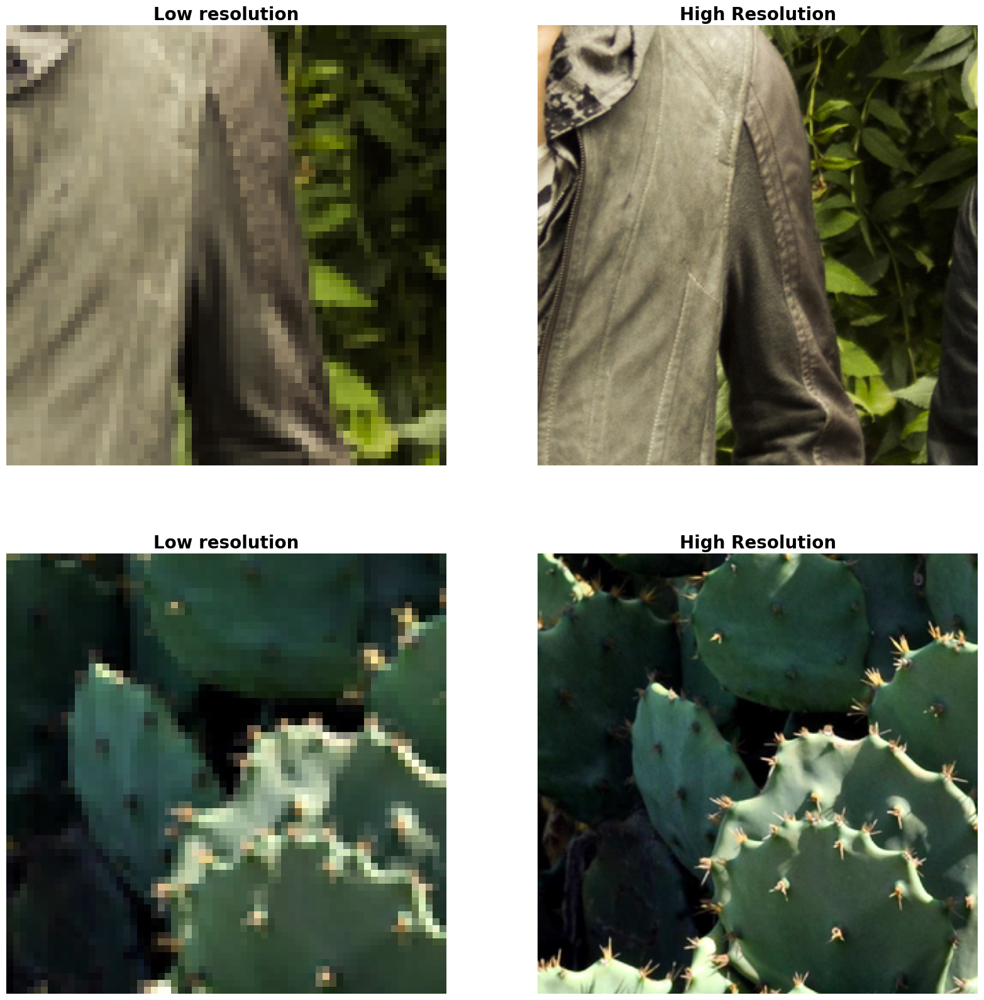

In [ ]:
plot_images(train_preprocessed,n_rows=2, figsize=(20, 20))

LR Shape is (510, 417, 3) and HR shape is (2040, 1668, 3)
LR Shape is (393, 510, 3) and HR shape is (1572, 2040, 3)


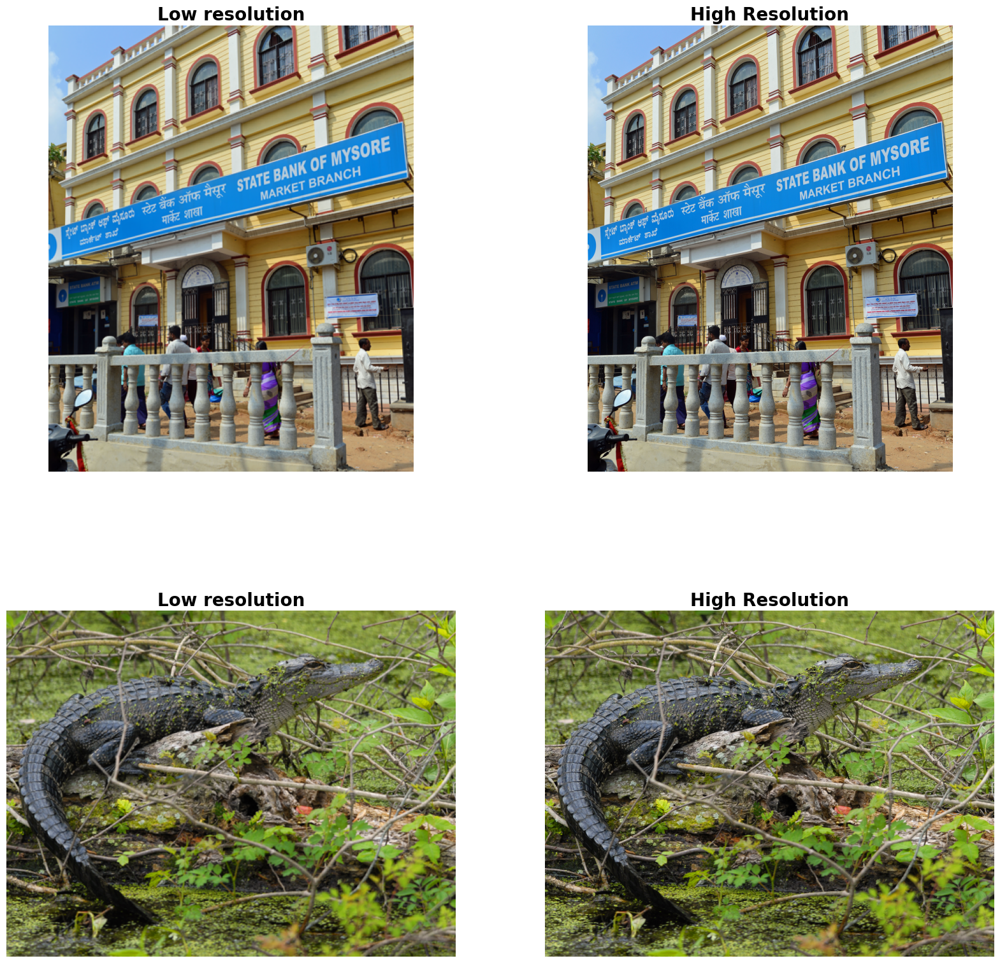

In [ ]:
plot_images(valid_preprocessed,n_rows=2, figsize=(20, 20))

#Downscaling

In [ ]:
def plot_ds_images(tf_dataset,n_cols,figsize=(20,2)):
    # subplots
    fig,axes = plt.subplots(nrows = 1, ncols = n_cols, figsize=figsize)
    for ax in axes.flatten():
        ax.axis('off')
    fig.suptitle('Downscaled')
    count=-1
    for hr in range(n_cols):
        count+=1
        axes[count].imshow(tf_dataset[hr])


In [ ]:
def plot_ori_images(tf_dataset,n_cols,figsize=(20,2)):
    # subplots
    fig,axes = plt.subplots(nrows = 1, ncols = n_cols, figsize=figsize)
    for ax in axes.flatten():
        ax.axis('off')
    fig.suptitle('Original')
    count=-1
    for hr in range(n_cols):
        count+=1
        axes[count].imshow(tf_dataset[hr])

In [ ]:
n_data = 300
scale_factor = 0.2

##Bicubic

In [ ]:
def lanczos_downsamp(image, scale_factor):
  img = Image.fromarray(image)
  downscaled_img = img.resize((int(img.width * scale_factor), int(img.height * scale_factor)), Image.LANCZOS)
  downscaled_array = tf.keras.preprocessing.image.img_to_array(downscaled_img)
  downscaled_array /= 255.0
  return downscaled_array

In [ ]:
downscaled_images_lanczos = []
ori_img_lanc = []
count = 0
for lr, hr in train_preprocessed.take(n_data).as_numpy_iterator():
  count=count+1
  if (count%100==0):
      print("100")
      count=0
  downscaled_image = lanczos_downsamp(hr[0], scale_factor)
  downscaled_images_lanczos.append(downscaled_image)
  ori_img_lanc.append(hr[0])

100
100
100


In [ ]:
downscaled_images_array_l = np.array(downscaled_images_lanczos)
print("Shape of downscaled images array:", downscaled_images_array_l.shape)

Shape of downscaled images array: (300, 64, 64, 3)


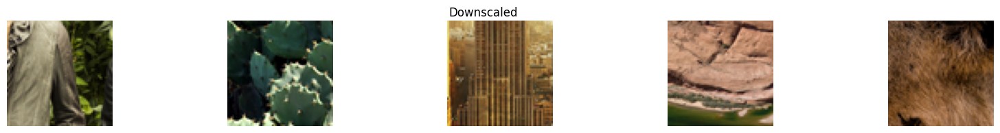

In [ ]:
plot_ds_images(downscaled_images_array_l, 5)

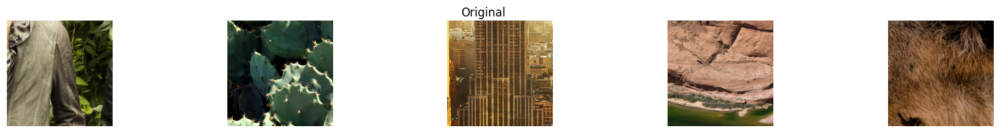

In [ ]:
plot_ori_images(ori_img_lanc, 5)

##Analysis

In [ ]:
from skimage.metrics import structural_similarity as ssim
from skimage.measure import shannon_entropy
from skimage.feature import greycomatrix, greycoprops
from sklearn.cluster import KMeans
import seaborn as sns
from skimage import color

In [ ]:
ori_img_lanc_sample = ori_img_lanc[0]
downscaled_images_lanczos_sample = downscaled_images_lanczos[0]
print(ori_img_lanc_sample.shape)
print(downscaled_images_lanczos_sample.shape)

(320, 320, 3)
(64, 64, 3)


In [ ]:
# Compute Entropy
original_entropy = shannon_entropy(ori_img_lanc_sample)
downscaled_entropy = shannon_entropy(downscaled_images_lanczos_sample)
print(f'Original Entropy: {original_entropy}')
print(f'Downscaled Entropy: {downscaled_entropy}')

Original Entropy: 7.628582403618913
Downscaled Entropy: 7.6122657063515735


In [ ]:
def plot_color_histograms(original, downscaled):
    color = ('r', 'g', 'b')

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5))
    fig.suptitle('Color Histograms')

    ax1.set_title('Original')
    for i, col in enumerate(color):
        orig_hist = cv2.calcHist([np.uint8(original)], [i], None, [256], [0, 256])
        ax1.plot(orig_hist, color=col)
    ax1.set_xlabel('Pixel Value')
    ax1.set_ylabel('Frequency')

    ax2.set_title('Downscaled')
    for i, col in enumerate(color):
        down_hist = cv2.calcHist([np.uint8(downscaled * 255)], [i], None, [256], [0, 256])
        ax2.plot(down_hist, color=col)
    ax2.set_xlabel('Pixel Value')
    ax2.set_ylabel('Frequency')

    plt.show()

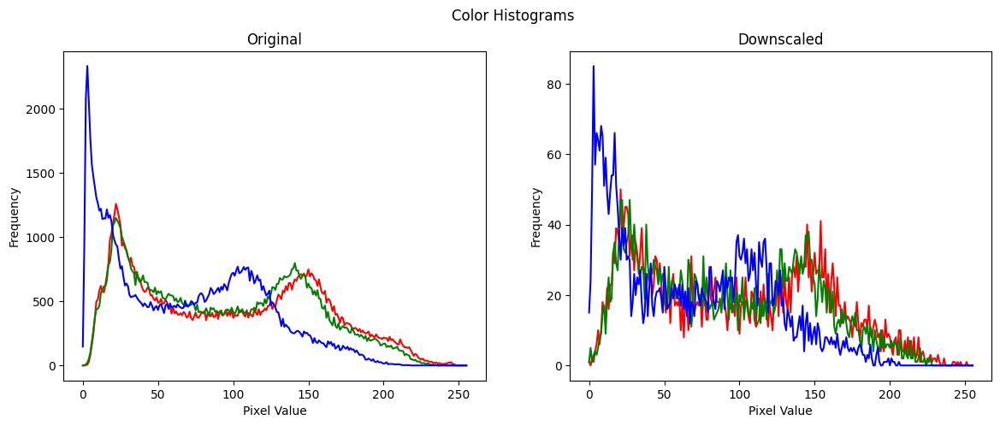

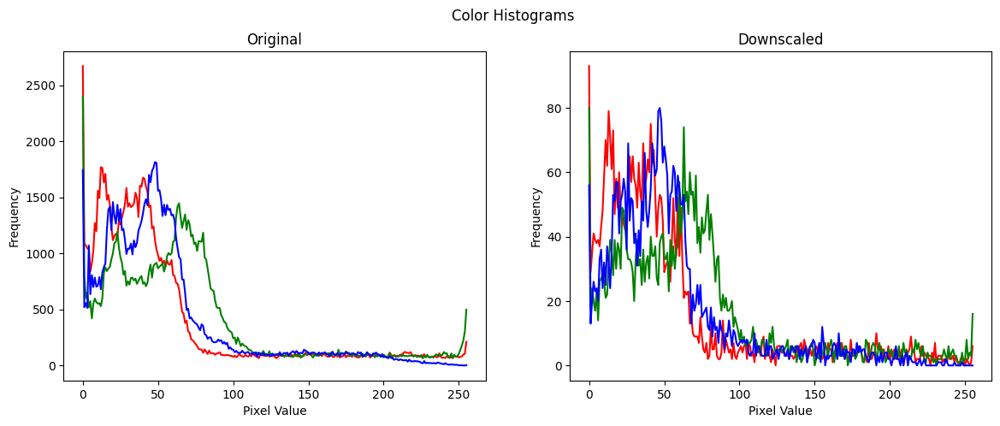

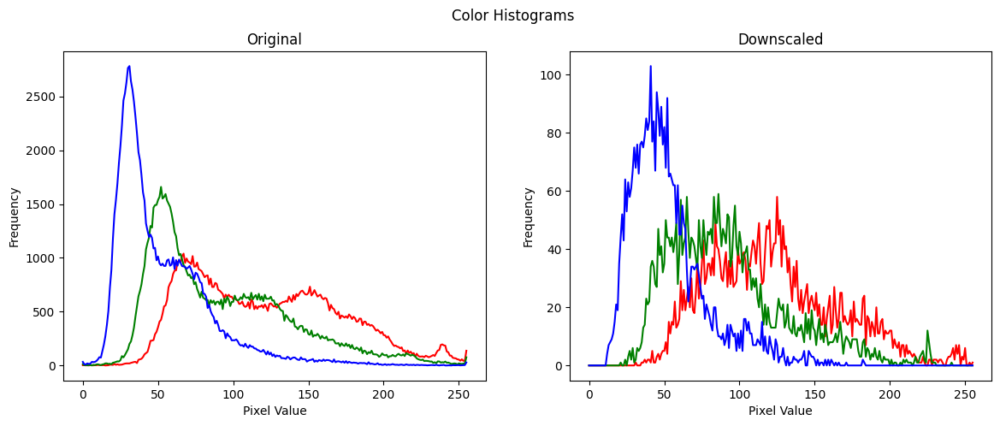

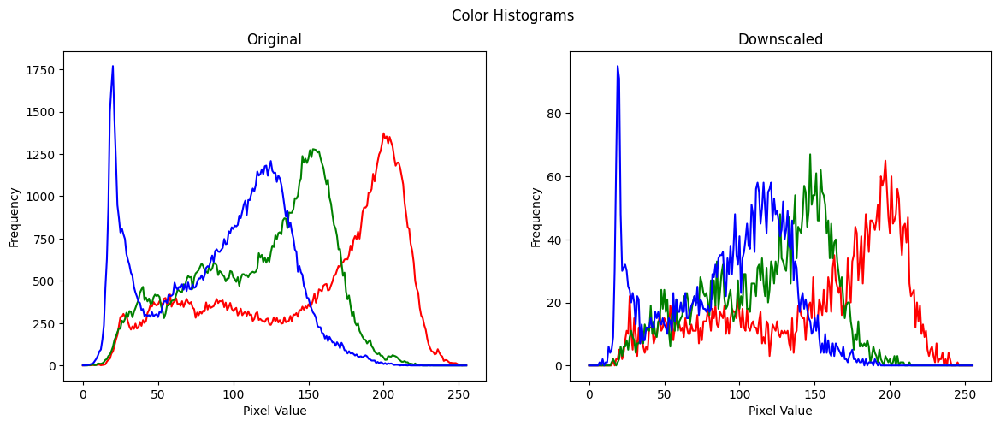

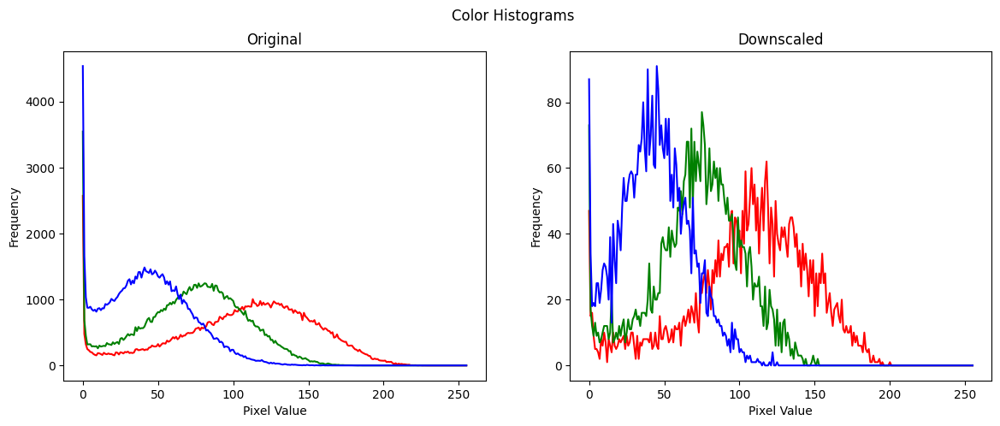

In [ ]:
for i in range(5):  # Plot histograms for 5 samples
    plot_color_histograms(ori_img_lanc[i], downscaled_images_lanczos[i])

In [ ]:
def get_dominant_colors(image, k=5):
    pixels = np.float32(image.reshape(-1, 3))
    _, labels, palette = cv2.kmeans(pixels, k, None,
                                    (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 0.2),
                                    10, cv2.KMEANS_RANDOM_CENTERS)
    _, counts = np.unique(labels, return_counts=True)
    dominant_colors = palette[np.argsort(-counts)]
    return dominant_colors.astype(int), counts

def plot_dominant_colors(dominant_colors, counts):
    plt.figure(figsize=(8, 4))
    plt.pie(counts, labels=[f'#{r:02x}{g:02x}{b:02x}' for r, g, b in dominant_colors],
            colors=[(r/255, g/255, b/255) for r, g, b in dominant_colors], startangle=90)
    plt.axis('equal')
    plt.title('Dominant Colors')
    plt.show()

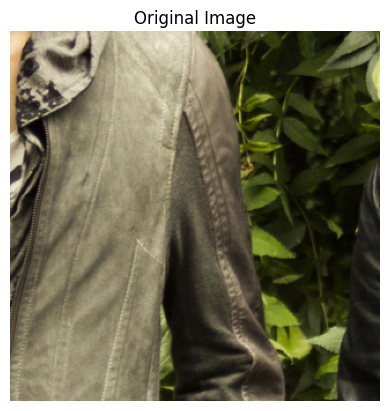

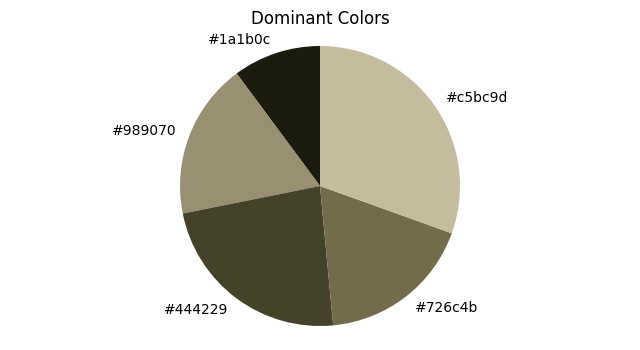

Color: #1a1b0c, Percentage: 10.15%
Color: #989070, Percentage: 18.00%
Color: #444229, Percentage: 23.35%
Color: #726c4b, Percentage: 18.01%
Color: #c5bc9d, Percentage: 30.49%


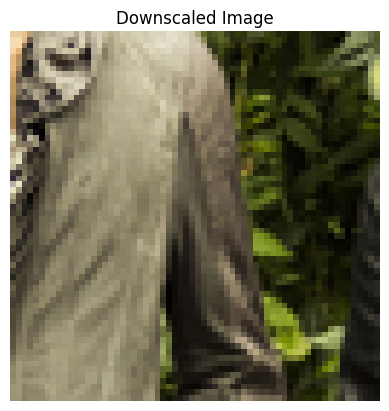

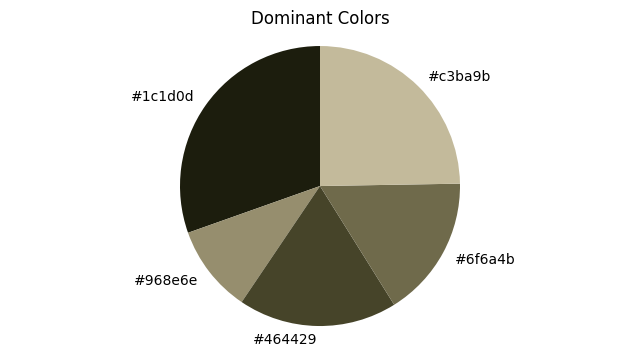

Color: #1c1d0d, Percentage: 30.42%
Color: #968e6e, Percentage: 10.13%
Color: #464429, Percentage: 18.33%
Color: #6f6a4b, Percentage: 16.38%
Color: #c3ba9b, Percentage: 24.73%


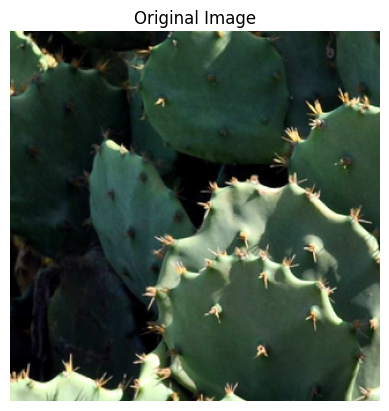

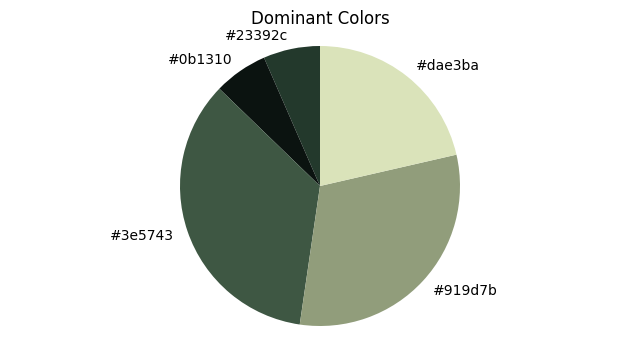

Color: #23392c, Percentage: 6.55%
Color: #0b1310, Percentage: 6.22%
Color: #3e5743, Percentage: 34.92%
Color: #919d7b, Percentage: 30.91%
Color: #dae3ba, Percentage: 21.41%


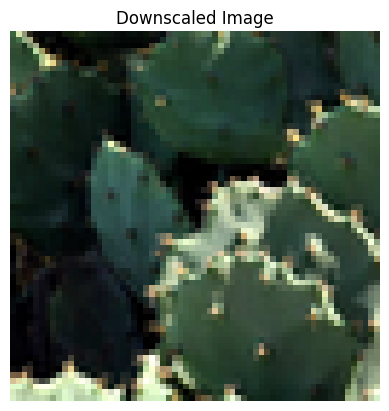

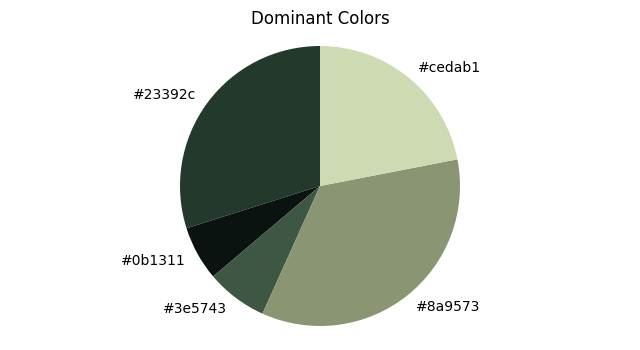

Color: #23392c, Percentage: 29.88%
Color: #0b1311, Percentage: 6.30%
Color: #3e5743, Percentage: 7.08%
Color: #8a9573, Percentage: 34.79%
Color: #cedab1, Percentage: 21.95%


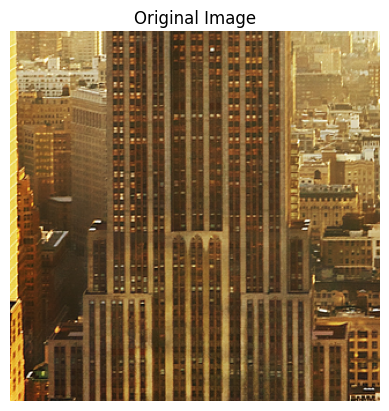

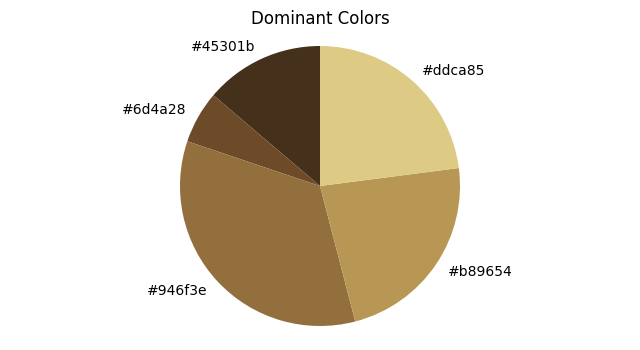

Color: #45301b, Percentage: 13.78%
Color: #6d4a28, Percentage: 6.04%
Color: #946f3e, Percentage: 34.23%
Color: #b89654, Percentage: 23.00%
Color: #ddca85, Percentage: 22.95%


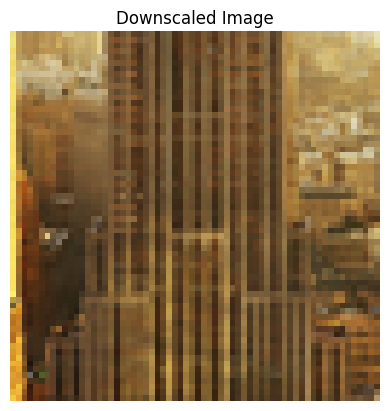

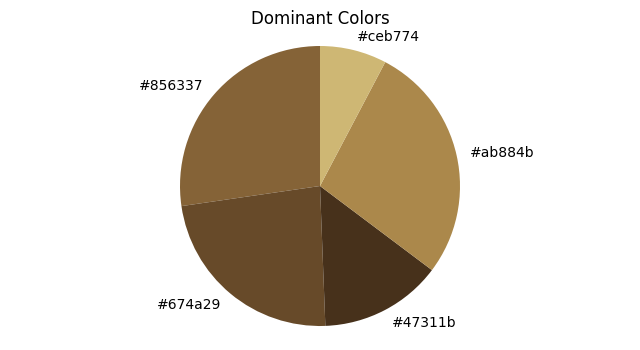

Color: #856337, Percentage: 27.29%
Color: #674a29, Percentage: 23.32%
Color: #47311b, Percentage: 14.14%
Color: #ab884b, Percentage: 27.54%
Color: #ceb774, Percentage: 7.71%


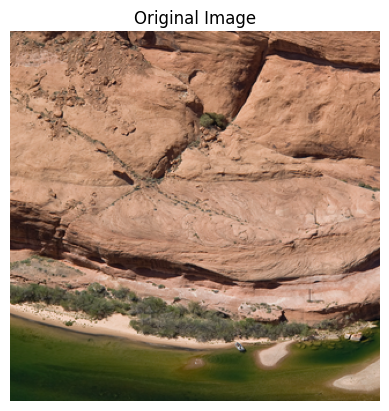

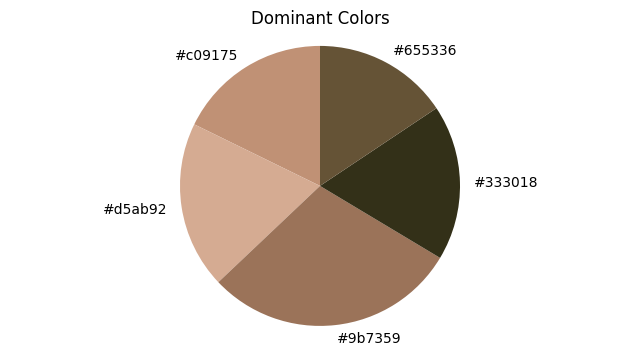

Color: #c09175, Percentage: 17.75%
Color: #d5ab92, Percentage: 19.31%
Color: #9b7359, Percentage: 29.34%
Color: #333018, Percentage: 17.96%
Color: #655336, Percentage: 15.63%


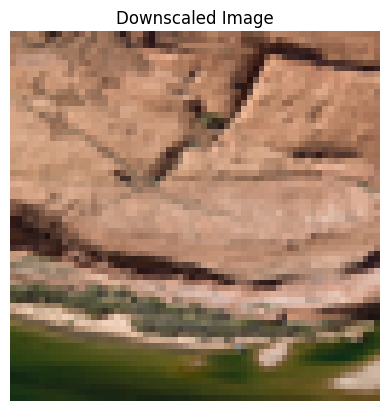

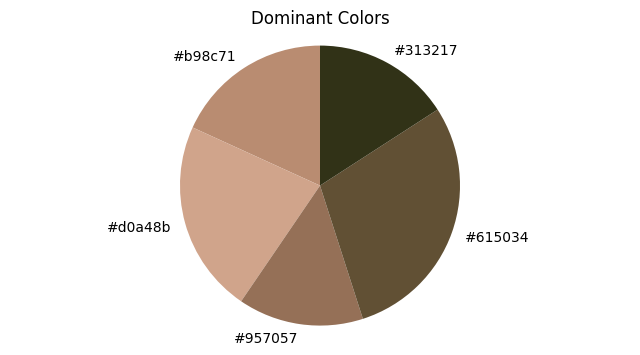

Color: #b98c71, Percentage: 18.19%
Color: #d0a48b, Percentage: 22.29%
Color: #957057, Percentage: 14.48%
Color: #615034, Percentage: 29.17%
Color: #313217, Percentage: 15.87%


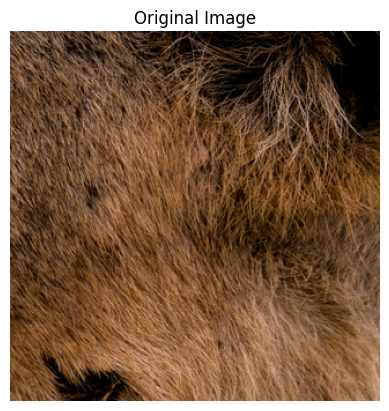

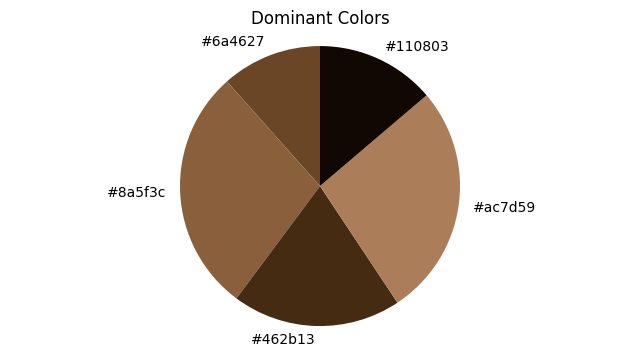

Color: #6a4627, Percentage: 11.57%
Color: #8a5f3c, Percentage: 28.25%
Color: #462b13, Percentage: 19.51%
Color: #ac7d59, Percentage: 26.89%
Color: #110803, Percentage: 13.78%


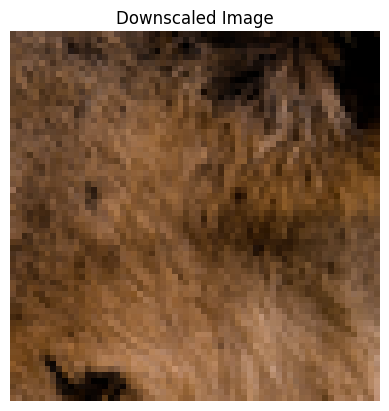

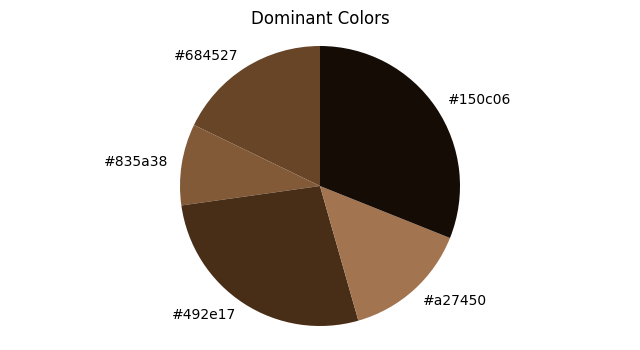

Color: #684527, Percentage: 17.82%
Color: #835a38, Percentage: 9.40%
Color: #492e17, Percentage: 27.20%
Color: #a27450, Percentage: 14.53%
Color: #150c06, Percentage: 31.05%


In [ ]:
for i in range(5):
    ori_img_lanc_sample = ori_img_lanc[i]
    downscaled_images_lanczos_sample = downscaled_images_lanczos[i]

    dominant_colors_ori, counts_ori = get_dominant_colors(ori_img_lanc_sample, k=5)
    dominant_colors_dwn, counts_dwn = get_dominant_colors(downscaled_images_lanczos_sample*255, k=5)

    plt.imshow(ori_img_lanc_sample)
    plt.title('Original Image')
    plt.axis('off')
    plt.show()

    plot_dominant_colors(dominant_colors_ori, counts_ori)

    total_pixels_ori = np.sum(counts_ori)
    percentage_colors_ori = (counts_ori / total_pixels_ori) * 100

    for color, percentage in zip(dominant_colors_ori, percentage_colors_ori):
        print(f'Color: #{color[0]:02x}{color[1]:02x}{color[2]:02x}, Percentage: {percentage:.2f}%')

    plt.imshow(downscaled_images_lanczos_sample)
    plt.title('Downscaled Image')
    plt.axis('off')
    plt.show()

    plot_dominant_colors(dominant_colors_dwn, counts_dwn)

    total_pixels_dwn = np.sum(counts_dwn)
    percentage_colors_dwn = (counts_dwn / total_pixels_dwn) * 100

    for color, percentage in zip(dominant_colors_dwn, percentage_colors_dwn):
        print(f'Color: #{color[0]:02x}{color[1]:02x}{color[2]:02x}, Percentage: {percentage:.2f}%')

In [ ]:
# Plot Color Scatter
def plot_color_scatter(original, downscaled):
    orig_pixels = original.reshape(-1, 3)
    down_pixels = downscaled.reshape(-1, 3)

    fig, axs = plt.subplots(1, 2, figsize=(12, 6))

    sns.scatterplot(x=orig_pixels[:, 0], y=orig_pixels[:, 1], hue=orig_pixels[:, 2], palette="viridis", ax=axs[0])
    axs[0].set_title('Original Image Color Scatter')
    axs[0].set_xlabel('Channel 0')
    axs[0].set_ylabel('Channel 1')

    sns.scatterplot(x=down_pixels[:, 0], y=down_pixels[:, 1], hue=down_pixels[:, 2], palette="viridis", ax=axs[1])
    axs[1].set_title('Downscaled Image Color Scatter')
    axs[1].set_xlabel('Channel 0')
    axs[1].set_ylabel('Channel 1')

    plt.show()


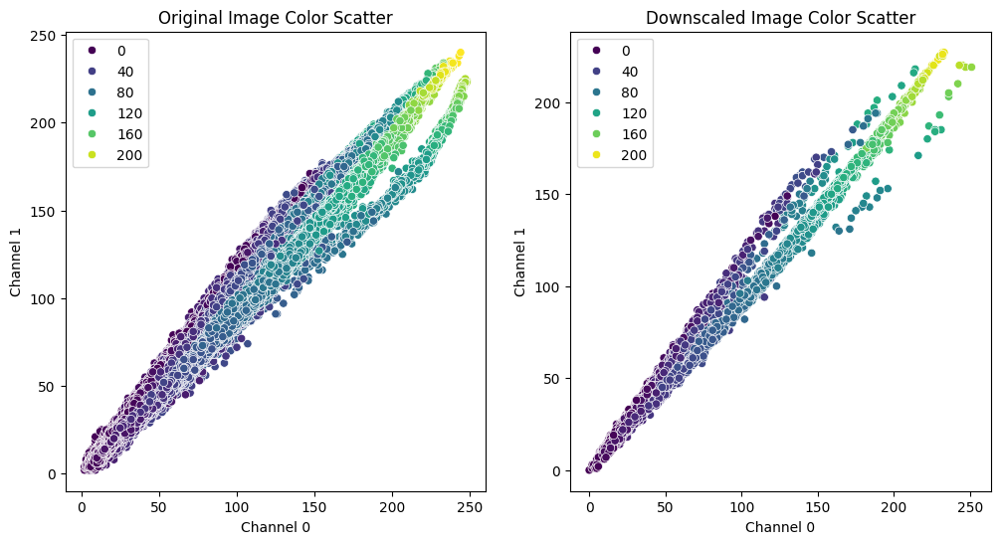

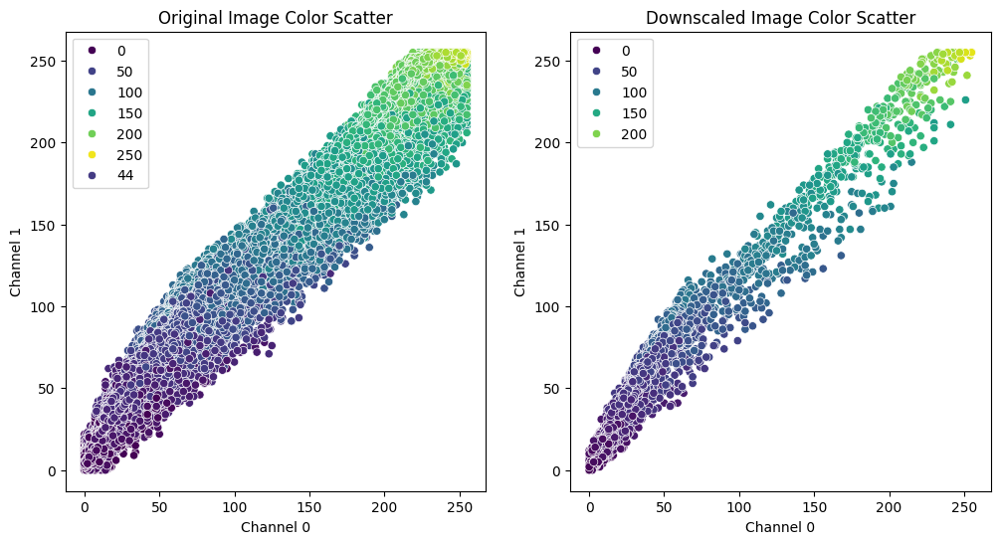

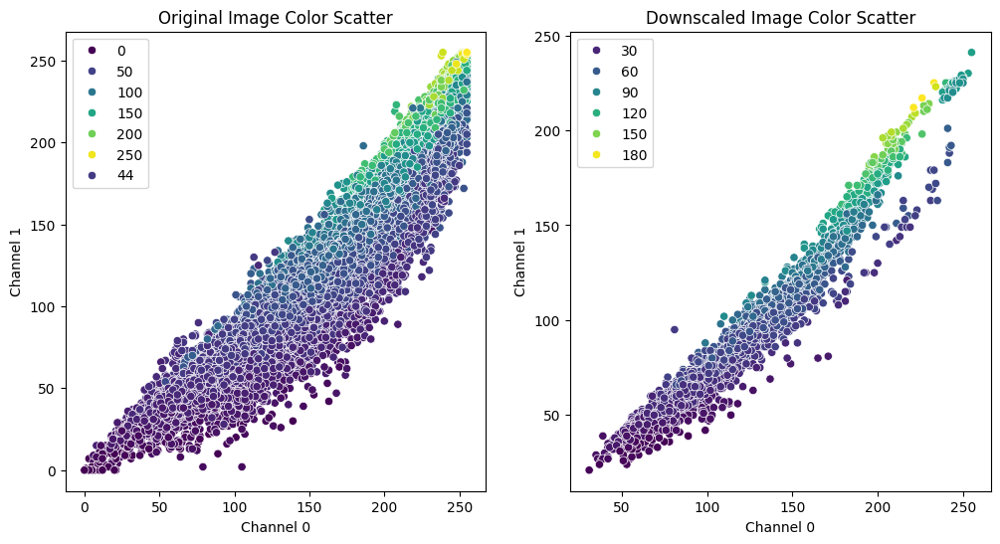

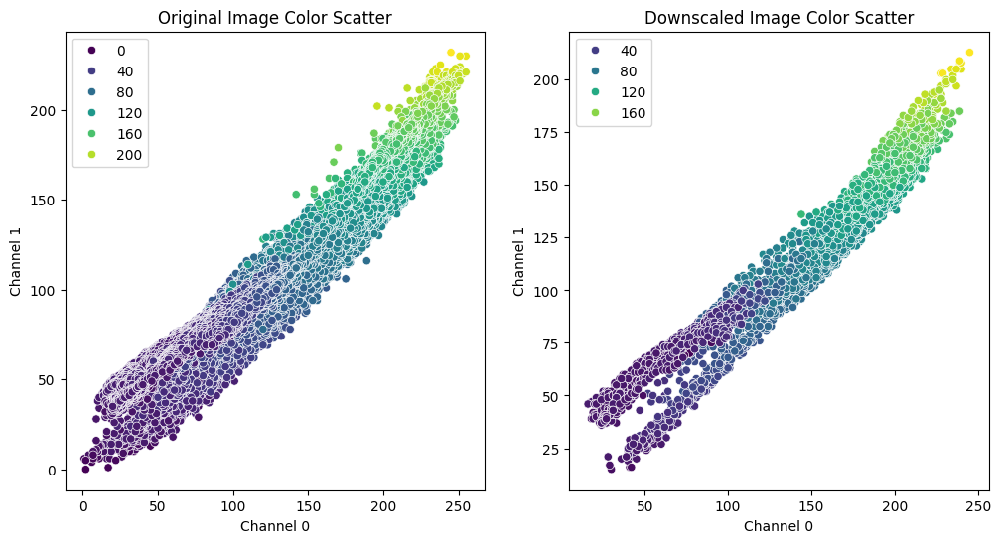

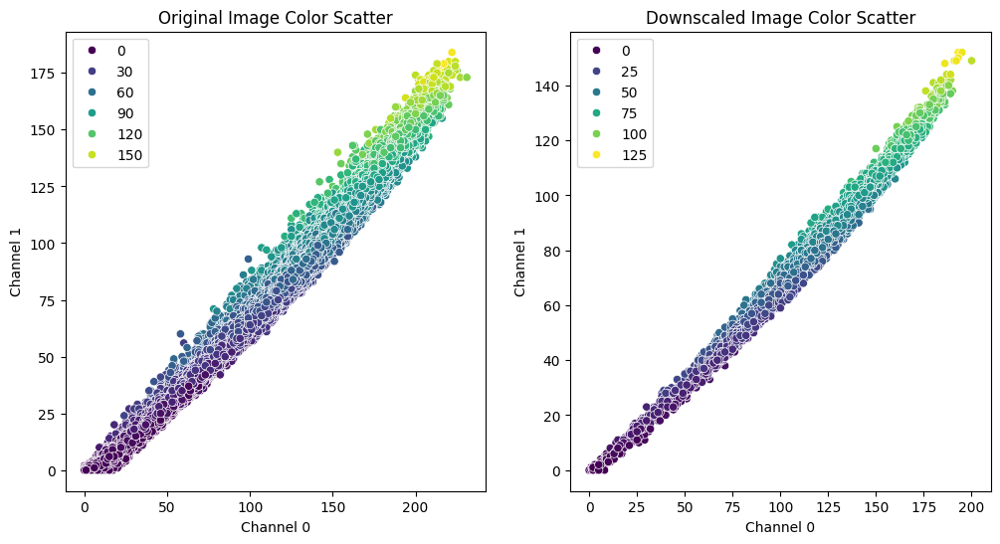

In [ ]:
for i in range(5):
  ori_img_lanc_sample = ori_img_lanc[i]
  downscaled_images_lanczos_sample = downscaled_images_lanczos[i]
  plot_color_scatter(ori_img_lanc_sample, downscaled_images_lanczos_sample*255)

In [ ]:
def quantize_colors(image, n_colors=8):
    pixels = np.reshape(image, (-1, 3))
    kmeans = KMeans(n_clusters=n_colors).fit(pixels)
    new_colors = kmeans.cluster_centers_[kmeans.predict(pixels)]
    return new_colors.reshape(image.shape)

def compute_histogram(image):
    hist = cv2.calcHist([np.uint8(image)], [0, 1, 2], None, [8, 8, 8], [0, 256, 0, 256, 0, 256])
    hist = cv2.normalize(hist, hist).flatten()
    return hist

def compare_color_histograms(hist1, hist2):
    return cv2.compareHist(hist1, hist2, cv2.HISTCMP_INTERSECT)

def compare_images(original_image, downscaled_image):
    # Quantize colors
    orig_quantized = quantize_colors(original_image)
    down_quantized = quantize_colors(downscaled_image)

    # Compute color histograms
    orig_hist = compute_histogram(orig_quantized)
    down_hist = compute_histogram(down_quantized)

    # Compare histograms
    hist_similarity = compare_color_histograms(orig_hist, down_hist)
    hist_similarity /= np.sum(orig_hist)
    return hist_similarity

In [ ]:
hist_similarities = []
for i in range(n_data):
  ori_img_lanc_sample = ori_img_lanc[i]
  downscaled_images_lanczos_sample = downscaled_images_lanczos[i]
  # Compare images
  hist_similarity = compare_images(ori_img_lanc_sample, downscaled_images_lanczos_sample*255)
  # Print results
  hist_similarities.append(hist_similarity)
hist_sim_average = np.mean(hist_similarities)
print(f'Average Histogram Similarity: {hist_sim_average}')

Average Histogram Similarity: 0.6509477960057188
